## Analysis

In [1]:
%load_ext autoreload
%autoreload 2
!python --version

Python 3.7.6


In [3]:
import sys
sys.path.append('..')

import os

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt

from src.analysis import plot_categoric_attribute, plot_discrete_attribute
from src.helpers import get_numberic_columns

In [4]:
sns.set(style="whitegrid")

%config InlineBackend.figure_format='retina'

plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams.update({'font.size': 15})

In [5]:
data = pd.read_csv('../data/fifa_processed.csv', index_col=0)

In [5]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

print("Number of numberic attributes - " + str(len(data.select_dtypes(include=['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).columns)))
print("Number of categorical attributes - " + str(len(data.select_dtypes(include=['object']).columns)))

Number of numberic attributes - 91
Number of categorical attributes - 40


In [6]:
len(['LS',
 'ST',
 'RS',
 'LW',
 'LF',
 'CF',
 'RF',
 'RW',
 'LAM',
 'CAM',
 'RAM',
 'LM',
 'LCM',
 'CM',
 'RCM',
 'RM',
 'LWB',
 'LDM',
 'CDM',
 'RDM',
 'RWB',
 'LB',
 'LCB',
 'CB',
 'RCB',
 'RB',])

26

In [7]:
data.head()

,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,...,LCB Value,LCB Grow,RCB Value,RCB Grow,RB Value,RB Grow,Work Rate Attack,Work Rate Defense,Position (4),Position (13)
Name,,,,,,,,,,,,,,,,,,,,,
L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,110500000.0,565000.0,...,47.0,2.0,47.0,2.0,59.0,2.0,Medium,Medium,attack,right attack
Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,77000000.0,405000.0,...,53.0,3.0,53.0,3.0,61.0,3.0,High,Low,attack,central attack
Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,118500000.0,290000.0,...,47.0,3.0,47.0,3.0,60.0,3.0,High,Medium,attack,left attack
De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,72000000.0,260000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Medium,Medium,goalkeeper,goalkeeper
K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,102000000.0,355000.0,...,66.0,3.0,66.0,3.0,73.0,3.0,High,High,middle,midfielder


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18207 entries, L. Messi to G. Nugent
Columns: 132 entries, Age to Position (13)
dtypes: bool(1), float64(85), int64(6), object(40)
memory usage: 18.4+ MB


In [9]:
print(f'in the dataset there are {len(data.columns)} columns and {len(data)} rows')

in the dataset there are 132 columns and 18207 rows


In [10]:
data.describe()

,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,...,RDM Value,RDM Grow,LB Value,LB Grow,LCB Value,LCB Grow,RCB Value,RCB Grow,RB Value,RB Grow
count,18207.000000,18207.000000,18207.000000,1.795500e+04,17966.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,...,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000,16122.000000
mean,25.122206,66.238699,71.307299,2.444530e+06,9861.850161,1597.809908,1.113222,2.947299,2.361308,19.546096,...,56.825146,2.020531,56.806786,2.020531,55.614626,2.020531,55.614626,2.020531,56.806786,2.020531
std,4.669943,6.908930,6.136496,5.626715e+06,22117.273534,272.586016,0.394031,0.660456,0.756164,15.947765,...,10.068077,0.143551,9.516241,0.143551,11.702658,0.143551,11.702658,0.143551,9.516241,0.143551
min,16.000000,46.000000,48.000000,1.000000e+04,1000.000000,731.000000,1.000000,1.000000,1.000000,1.000000,...,28.000000,2.000000,29.000000,2.000000,25.000000,2.000000,25.000000,2.000000,29.000000,2.000000
25%,21.000000,62.000000,67.000000,3.250000e+05,1000.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,...,49.000000,2.000000,50.000000,2.000000,46.000000,2.000000,46.000000,2.000000,50.000000,2.000000
50%,25.000000,66.000000,71.000000,7.000000e+05,3000.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,...,58.000000,2.000000,58.000000,2.000000,57.000000,2.000000,57.000000,2.000000,58.000000,2.000000
75%,28.000000,71.000000,75.000000,2.100000e+06,9000.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,...,64.000000,2.000000,64.000000,2.000000,65.000000,2.000000,65.000000,2.000000,64.000000,2.000000
max,45.000000,94.000000,95.000000,1.185000e+08,565000.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,...,87.000000,5.000000,84.000000,5.000000,87.000000,5.000000,87.000000,5.000000,84.000000,5.000000


## Missing values

In [11]:
# https://github.com/ResidentMario/missingno
!pip install missingno

import missingno as msno

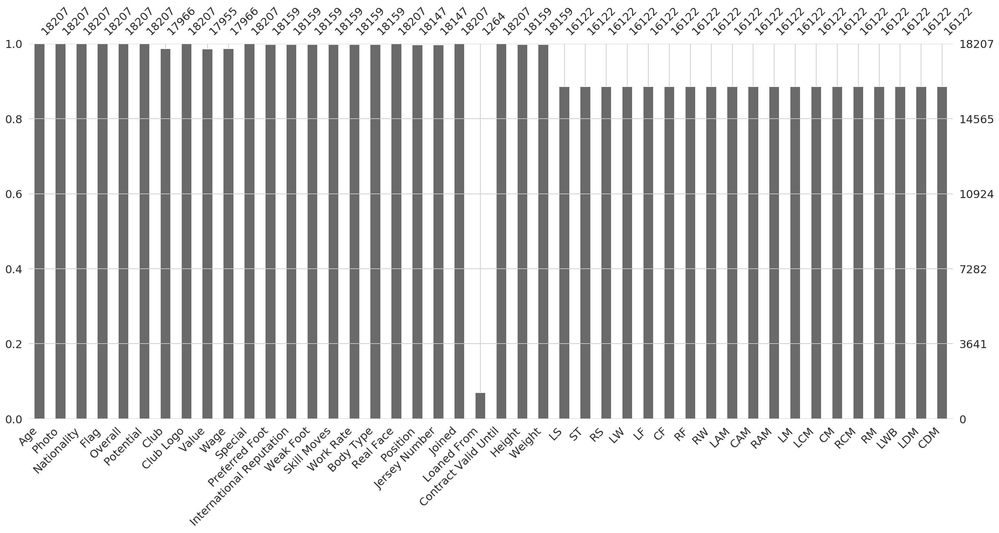

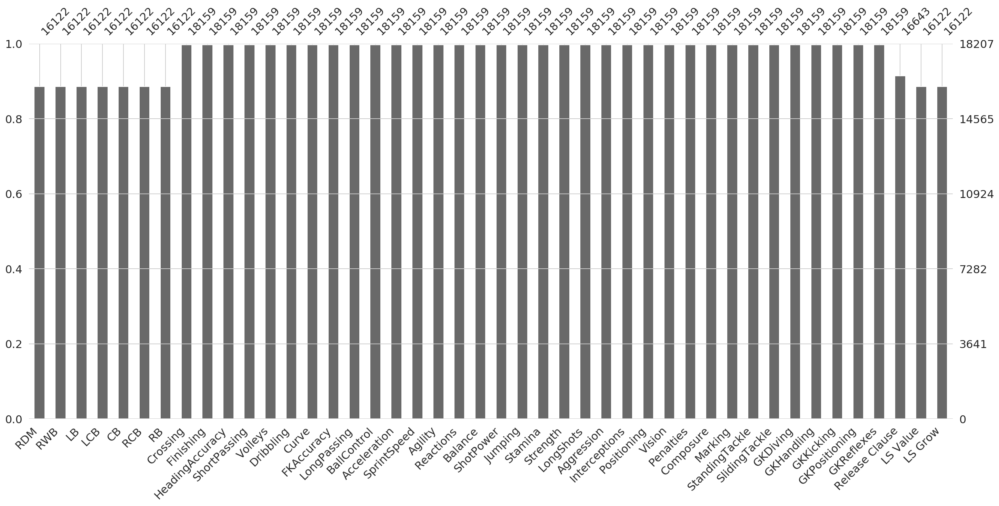

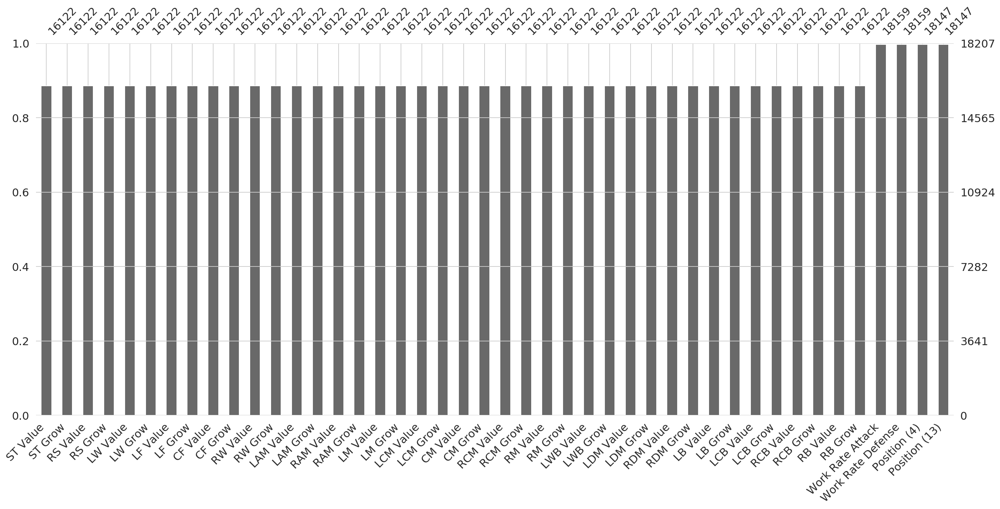

In [12]:
plot_count = 3
column_groups = np.array_split(data.columns, plot_count)

for columns in column_groups:
    msno.bar(data[columns])
    plt.show()

We can see that, we miss some data in following columns:
- `Club` - as some players can be "free agent" and without the club
- `Jersey Number` - some players might not have a jersey number when they are without he club
- `Joined` - indicates when a player joined the club, not sure why there are a missing values
- `Loaned From` - not every player is on loan somewhere
- `Contract Valid Until` - some players might miss this value, espacially those without the club
- `LS`, `ST`, `RS`, `LW`, `LF`, `CF`, `RW`, `LAM`, `RAM`, `LM`, `LCM`, `CM`, `RCM`, `RM`, `LWB`, `LDM`, `RDM`, `LB`, `LCB`, `RCB`, `RB` - these are the positions that player can play, not sure why these columns are missing some values, we need to examine it
- `Release Clause` - this is ok, some players may have release clause in their contract

In [13]:
plot = msno.heatmap(data)

fig = plot.figure

fig.set_size_inches(70, 50)
fig.set_tight_layout(True)

Hint how to interpret the plot above [(reference)](https://github.com/ResidentMario/missingno#heatmap),
> Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does).

We plot the correlation between the missing values. We can notice that when some player miss a value from `LW`, `LF`, `CF`, `RW`, `LAM`, `RAM`, `LM`, `LCM`, `CM`, `RCM`, `RM`, `LWB`, `LDM`, `RDM`, `LB`, `LCB`, `RCB`, `RB` they miss the rest of them.

We can also see that when plater is on loan, they will most likely not have a release close.

### Denrogram

Hint how to interpret the plot below [(reference)](Hint how to interpret the plot above [(reference)](https://github.com/ResidentMario/missingno#heatmap)),
> The dendrogram allows you to more fully correlate variable completion, revealing trends deeper than the pairwise ones visible in the correlation heatmap. To interpret this graph, read it from a __top-down__ perspective. Cluster leaves which linked together at a distance of zero fully predict one another's presence—one variable might always be empty when another is filled, or they might always both be filled or both empty, and so on. Cluster leaves which split close to zero, but not at it, predict one another very well, but still imperfectly.

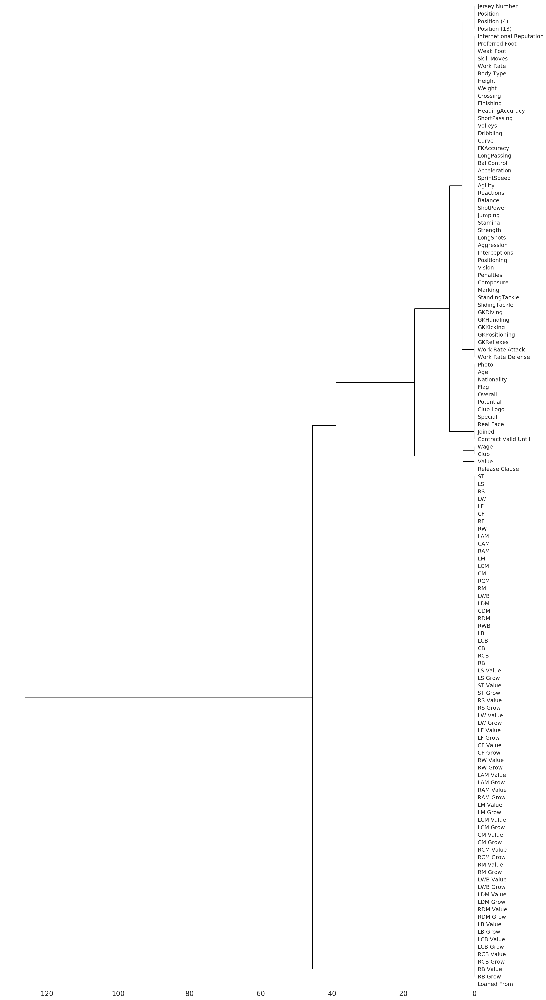

In [14]:
msno.dendrogram(data)

### Attributes `LS`, `ST`...

Now we will examine which players have `LS`, `ST`... values empty.

In [15]:
specific_positions = ['LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RW', 'LAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'RDM', 'LB', 'LCB', 'RCB', 'RB', 'RF','CAM','CDM','CB']

2085 players miss these values

In [16]:
data_with_empty_positions = data[data[specific_positions].isnull().any(axis=1)]
len(data_with_empty_positions)

2085

It seems only goalkeepers and players without a position lack these values

In [17]:
data_with_empty_positions['Position'].value_counts()

GK    2025
Name: Position, dtype: int64

Only goalkeeprs do have these (LS, ST...) values empty. These columns means specific positions. LS stands for left striker, ST for striker or LCM for Left Central Midfielder Since these values are numeric they might indicate how much player fits that specific position on scale form 0 to 100.

## Numerical attributes

In [18]:
from src.analysis import plot_categoric_attribute, plot_discrete_attribute, get_numberic_columns

In [19]:
numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
numeric_columns

['Age',
 'Overall',
 'Potential',
 'Value',
 'Wage',
 'Special',
 'International Reputation',
 'Weak Foot',
 'Skill Moves',
 'Jersey Number',
 'Joined',
 'Contract Valid Until',
 'Height',
 'Weight',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Release Clause',
 'LS Value',
 'LS Grow',
 'ST Value',
 'ST Grow',
 'RS Value',
 'RS Grow',
 'LW Value',
 'LW Grow',
 'LF Value',
 'LF Grow',
 'CF Value',
 'CF Grow',
 'RW Value',
 'RW Grow',
 'LAM Value',
 'LAM Grow',
 'RAM Value',
 'RAM Grow',
 'LM Value',
 'LM Grow',
 'LCM Value',
 'LCM Grow',
 'CM 

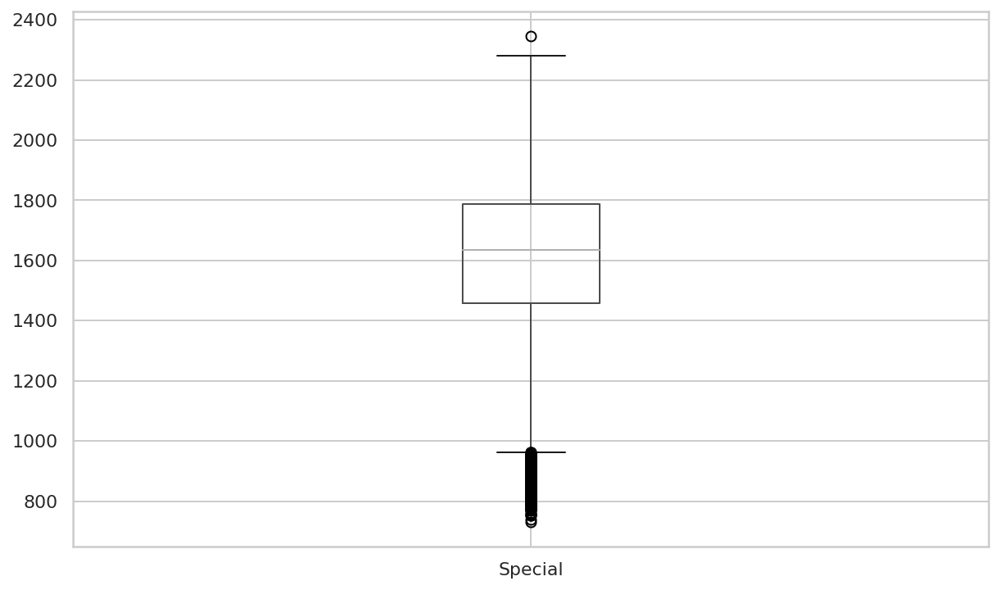

In [20]:
data.boxplot(column=['Special'])

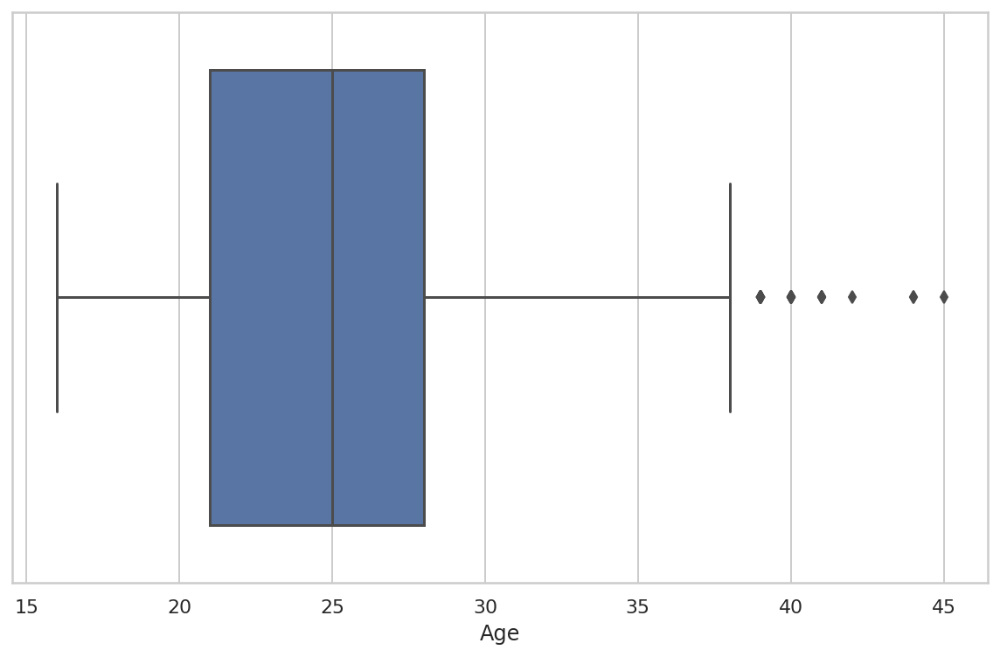

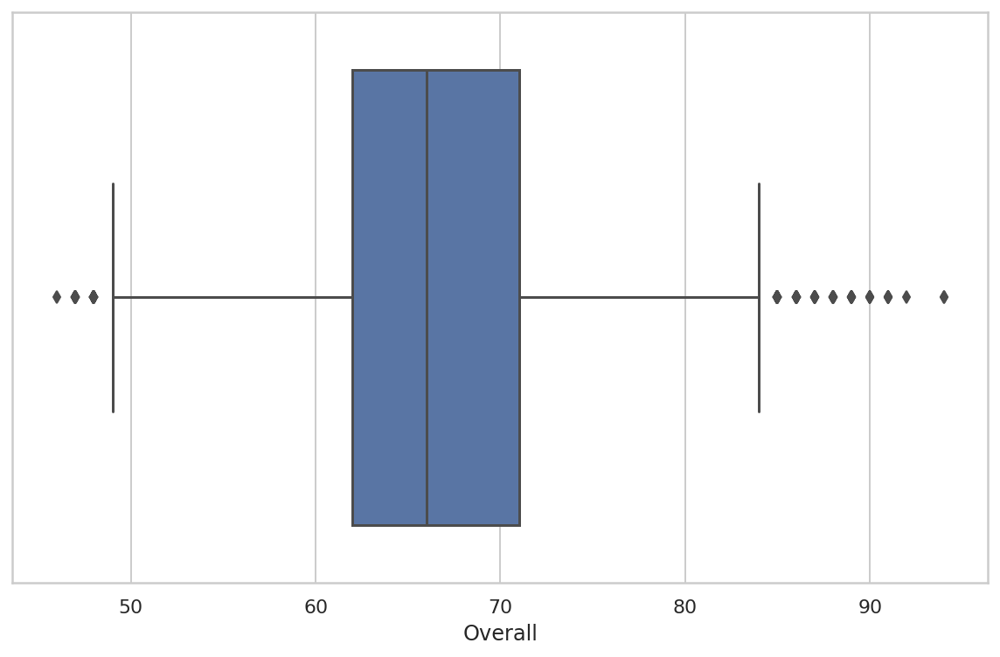

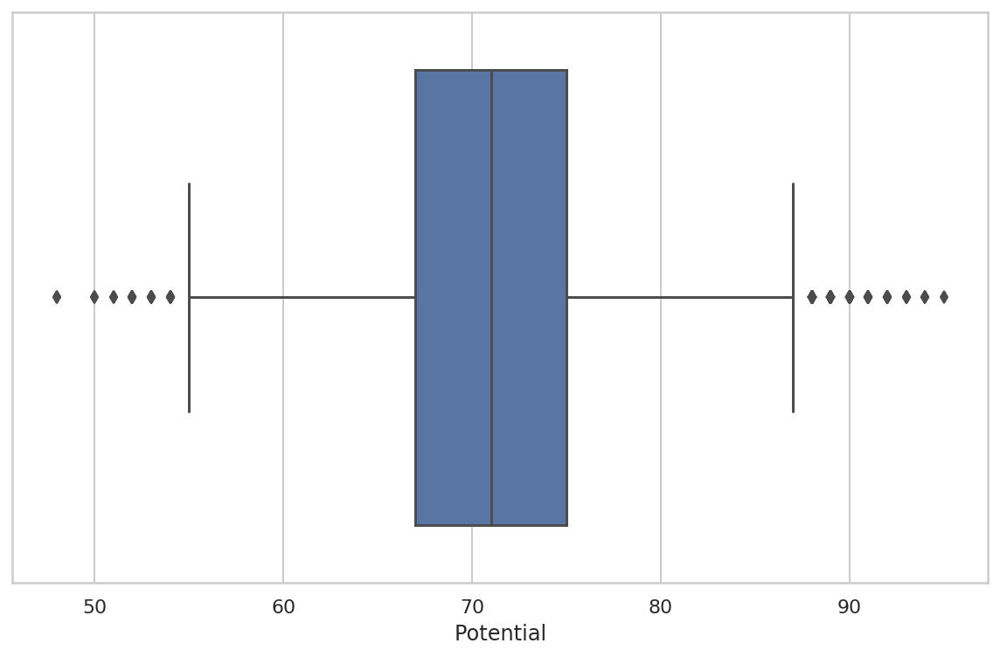

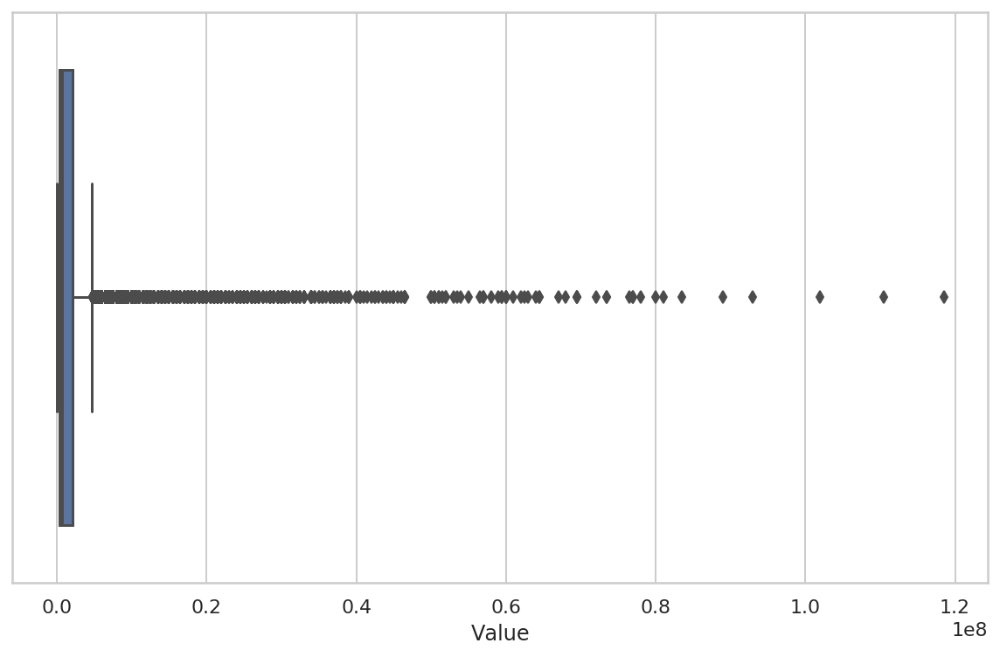

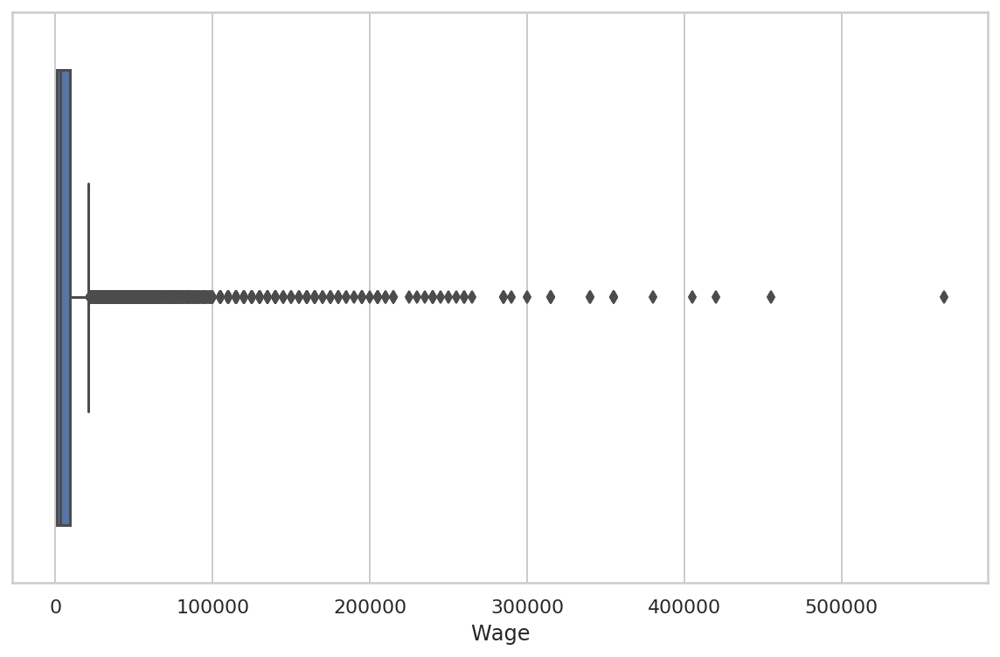

...

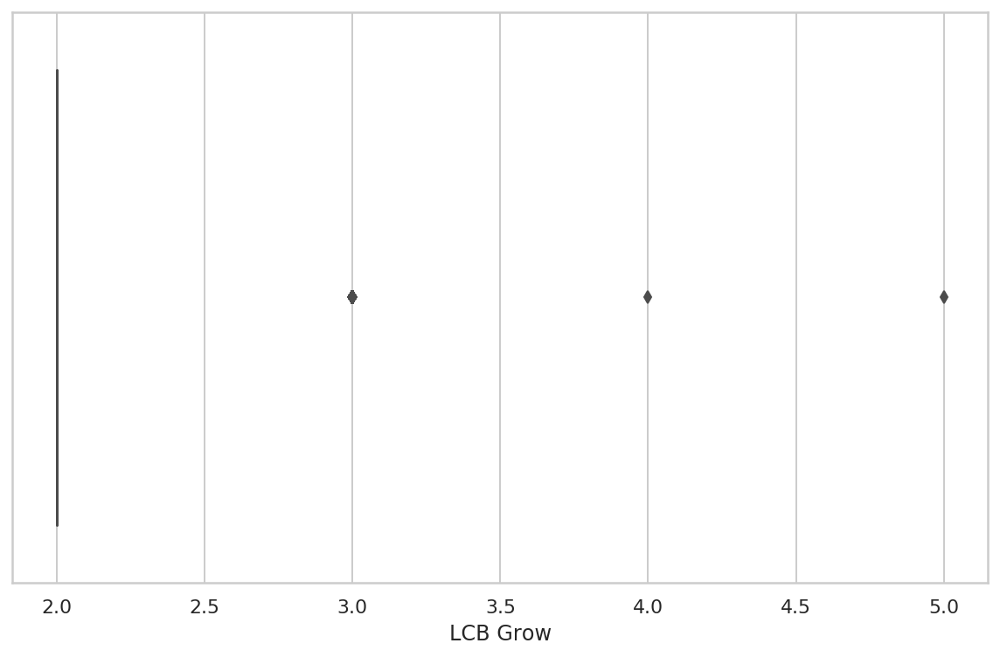

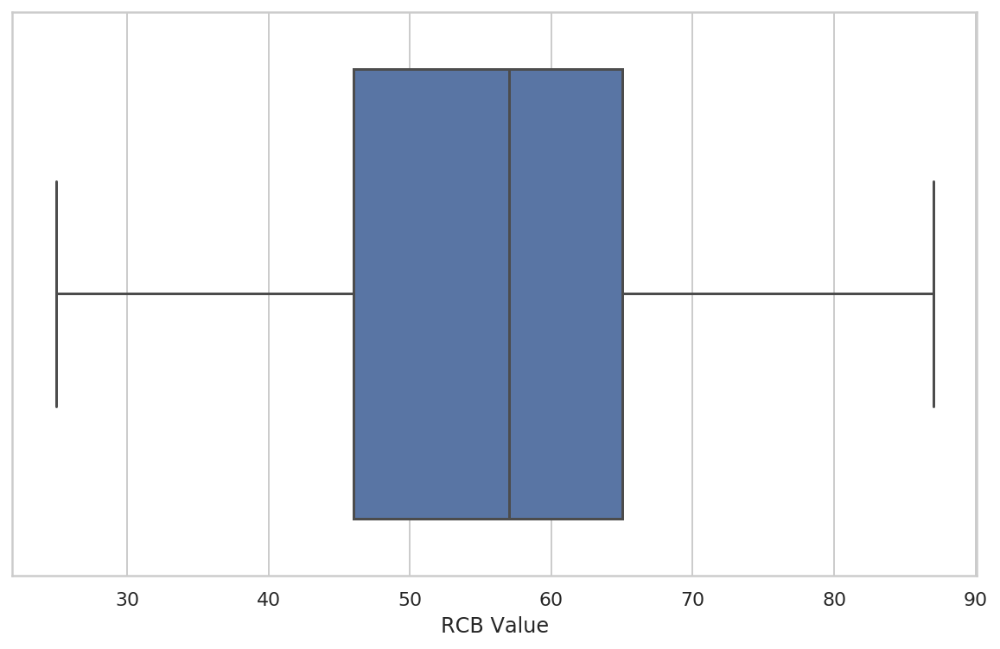

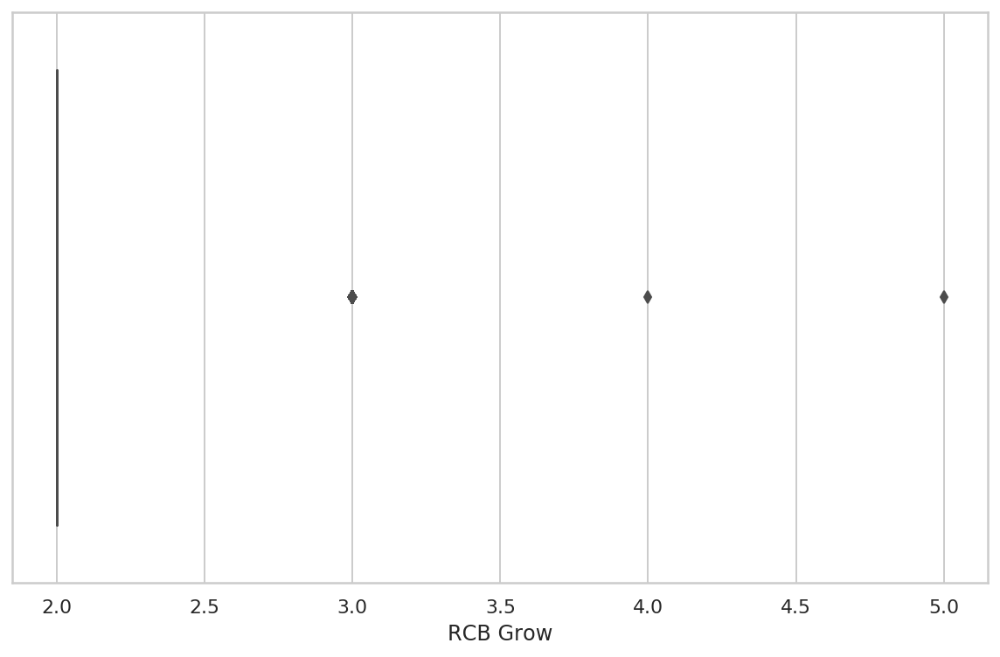

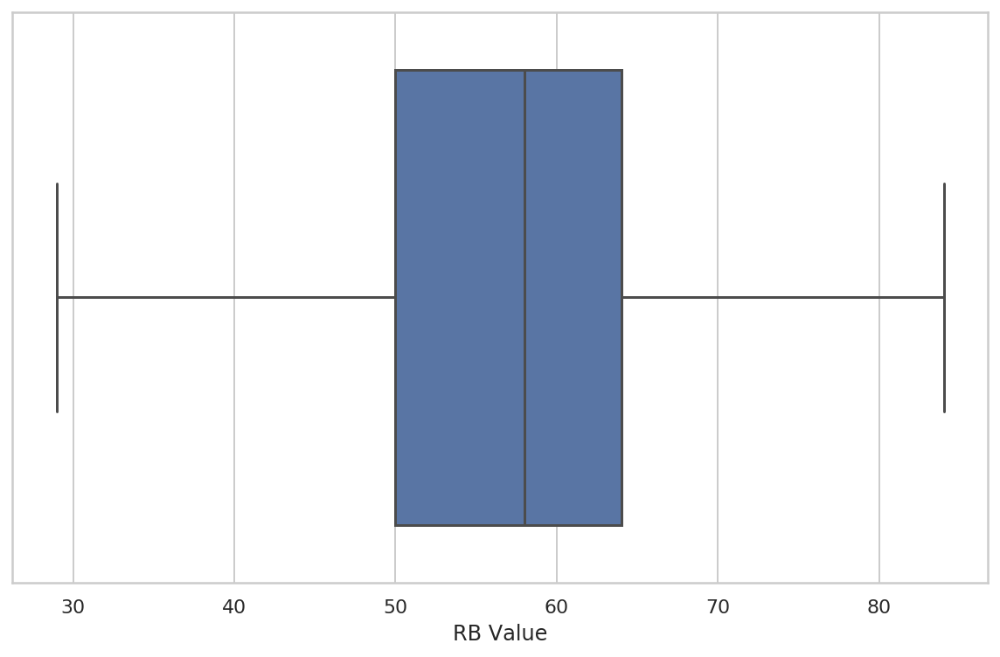

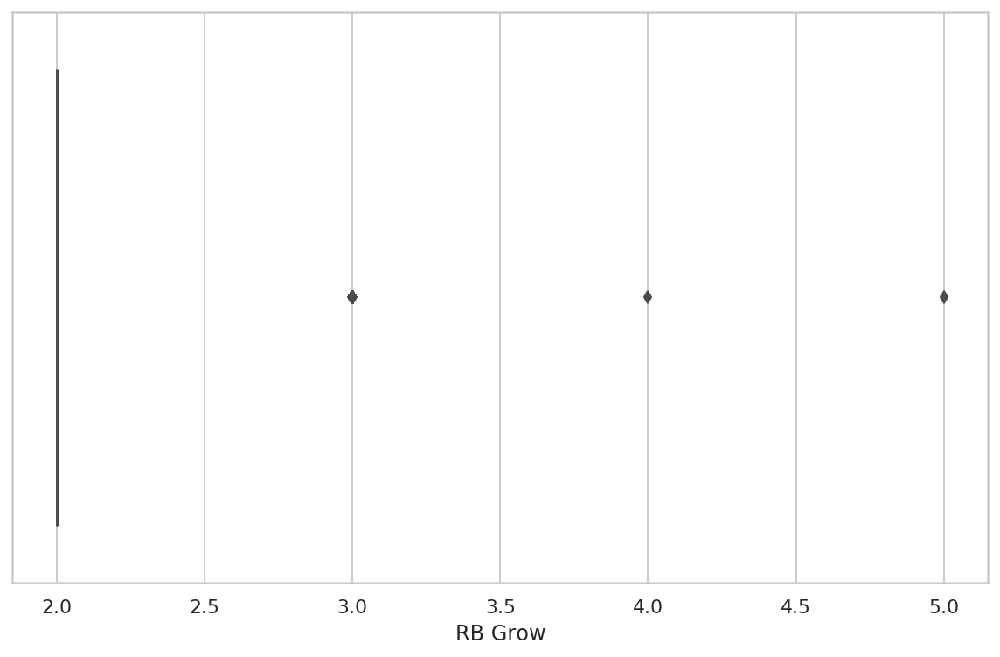

In [21]:
for col in [x for x in numeric_columns if x not in ["Special", "Joined", "Contract Valid Until"]]:
    sns.boxplot(x=data[col])
    plt.show()

## Categorical attributes

In [22]:
categorical_attributes = [item for item in data.columns if item not in numeric_columns]
categorical_attributes

['Photo',
 'Nationality',
 'Flag',
 'Club',
 'Club Logo',
 'Preferred Foot',
 'Work Rate',
 'Body Type',
 'Real Face',
 'Position',
 'Loaned From',
 'LS',
 'ST',
 'RS',
 'LW',
 'LF',
 'CF',
 'RF',
 'RW',
 'LAM',
 'CAM',
 'RAM',
 'LM',
 'LCM',
 'CM',
 'RCM',
 'RM',
 'LWB',
 'LDM',
 'CDM',
 'RDM',
 'RWB',
 'LB',
 'LCB',
 'CB',
 'RCB',
 'RB',
 'Work Rate Attack',
 'Work Rate Defense',
 'Position (4)',
 'Position (13)']

In [23]:
meaningful_categorical_attributes = [
 'Nationality',
 'Club',
 'Preferred Foot',
 'Work Rate',
 'Body Type',
 'Real Face',
 'Position',
 'Loaned From',
 'LS',
 'ST',
 'RS',
 'LW',
 'LF',
 'CF',
 'RF',
 'RW',
 'LAM',
 'CAM',
 'RAM',
 'LM',
 'LCM',
 'CM',
 'RCM',
 'RM',
 'LWB',
 'LDM',
 'CDM',
 'RDM',
 'RWB',
 'LB',
 'LCB',
 'CB',
 'RCB',
 'RB',
 'Work Rate Attack',
 'Work Rate Defense'
]

In [24]:
# Pomocna funkcia na vykreslenie grafu na znazornenie distribucie hodnot

def column_distribution(dataSet, column, figWidth=25):
     dataSet[column].value_counts().plot(kind='bar', figsize=[figWidth, 10])

In [25]:
# for col in meaningful_categorical_attributes:
#     column_distribution(data, col)
#     plt.show()

## Correlations between numerical attributes

In [26]:
# Correlation of all attributes
fig, ax = plt.subplots(figsize=(70,70))
sns.heatmap(data.corr(), ax=ax, annot=True, fmt=".3f")

## Attribute Position

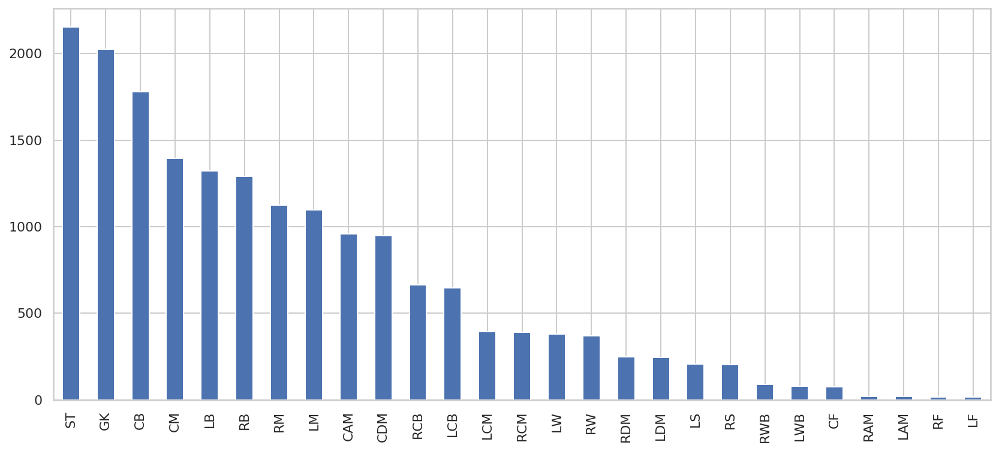

In [27]:
data['Position'].value_counts().plot(kind='bar', figsize=[14, 6])

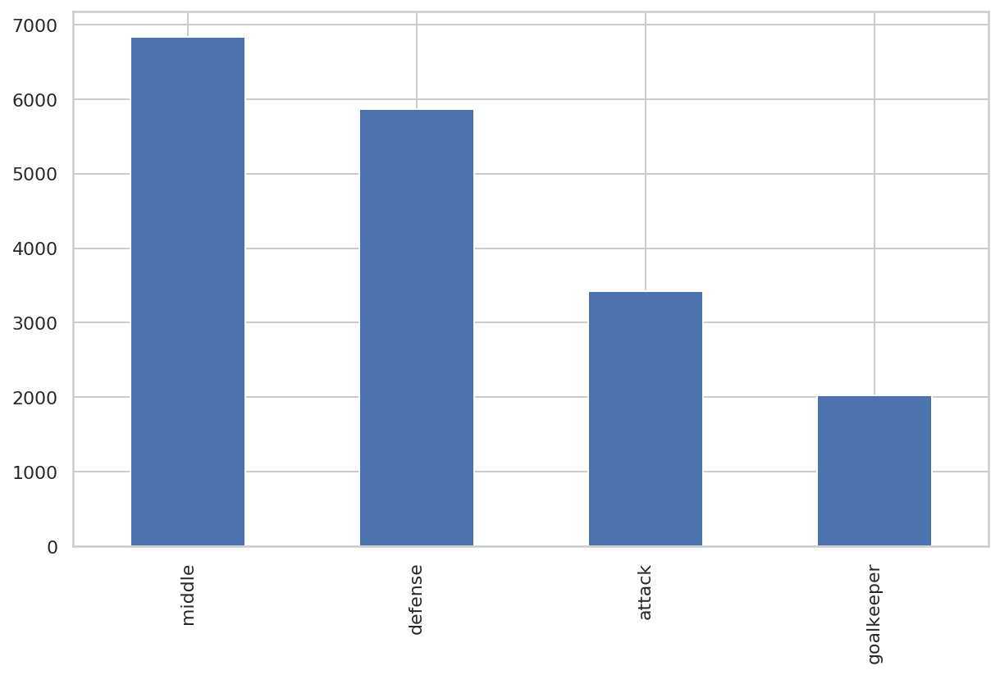

In [28]:
data['Position (4)'].value_counts().plot(kind='bar', figsize=[10, 6])

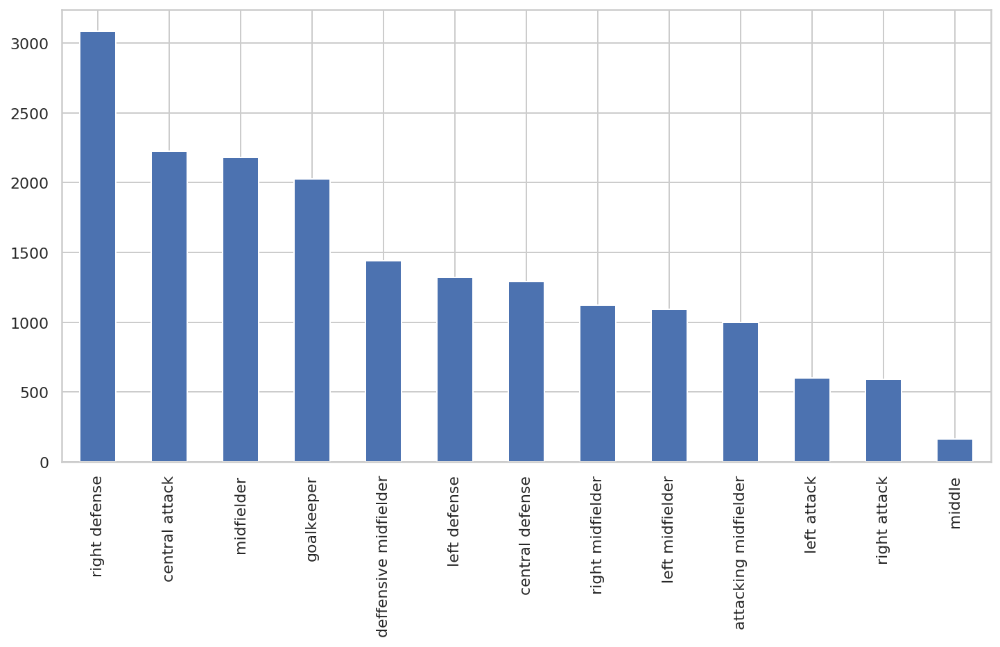

In [29]:
data['Position (13)'].value_counts().plot(kind='bar', figsize=[12, 6])

## Pair analysis between numerical attributes with hue on 'Position' attribute

In [30]:
# from src.constants import NUMERIC_ATTRIBUTES

# for i in range(len(NUMERIC_ATTRIBUTES)):
#     for j in range(i, len(NUMERIC_ATTRIBUTES)):
#         if (NUMERIC_ATTRIBUTES[i] != NUMERIC_ATTRIBUTES[j]):
#             fig, ax = plt.subplots(figsize=(8, 12))
#             sns.scatterplot(ax=ax, x=NUMERIC_ATTRIBUTES[i], y=NUMERIC_ATTRIBUTES[j], hue="Position", data=data)
#             plt.show()    

In [31]:
# from src.constants import NUMERIC_ATTRIBUTES

# for i in range(len(NUMERIC_ATTRIBUTES)):
#     for j in range(i, len(NUMERIC_ATTRIBUTES)):
#         if (NUMERIC_ATTRIBUTES[i] != NUMERIC_ATTRIBUTES[j]):
#             fig, ax = plt.subplots(figsize=(5, 5))
#             sns.scatterplot(ax=ax, x=NUMERIC_ATTRIBUTES[i], y=NUMERIC_ATTRIBUTES[j], hue="Position (4)", data=data)
#             plt.show()

In [32]:
# from src.constants import NUMERIC_ATTRIBUTES

# for i in range(len(NUMERIC_ATTRIBUTES)):
#     for j in range(i, len(NUMERIC_ATTRIBUTES)):
#         if (NUMERIC_ATTRIBUTES[i] != NUMERIC_ATTRIBUTES[j]):
#             fig, ax = plt.subplots(figsize=(8, 8))
#             sns.scatterplot(ax=ax, x=NUMERIC_ATTRIBUTES[i], y=NUMERIC_ATTRIBUTES[j], hue="Position (13)", data=data)
#             plt.show()

## Attributes correlation with 'Value' attribute

In [33]:
def find_correlative_attributes(attributeName, df, correlation=0.5):
    correlated_attributes = []
    for col in df.select_dtypes(include=np.number).columns:
        corr = df[attributeName].corr(df[col])
        if (abs(corr) >= correlation and col != attributeName):correlated_attributes.append((col, corr))            
    return correlated_attributes    

In [34]:
wage_correlated_attributes = find_correlative_attributes('Value', data)
wage_correlated_attributes

[('Overall', 0.631847741357768),
 ('Potential', 0.5796076758998799),
 ('Wage', 0.8580862371713884),
 ('International Reputation', 0.6561584940744846),
 ('Reactions', 0.5449929175418267),
 ('Release Clause', 0.9943523112035934),
 ('LS Grow', 0.5756140455032684),
 ('ST Grow', 0.5756140455032684),
 ('RS Grow', 0.5756140455032684),
 ('LW Grow', 0.5756140455032684),
 ('LF Grow', 0.5756140455032684),
 ('CF Grow', 0.5756140455032684),
 ('RW Grow', 0.5756140455032684),
 ('LAM Grow', 0.5756140455032684),
 ('RAM Grow', 0.5756140455032684),
 ('LM Grow', 0.5756140455032684),
 ('LCM Grow', 0.5756140455032684),
 ('CM Grow', 0.5756140455032684),
 ('RCM Grow', 0.5756140455032684),
 ('RM Grow', 0.5756140455032684),
 ('LWB Grow', 0.5756140455032684),
 ('LDM Grow', 0.5756140455032684),
 ('RDM Grow', 0.5756140455032684),
 ('LB Grow', 0.5756140455032684),
 ('LCB Grow', 0.5756140455032684),
 ('RCB Grow', 0.5756140455032684),
 ('RB Grow', 0.5756140455032684)]

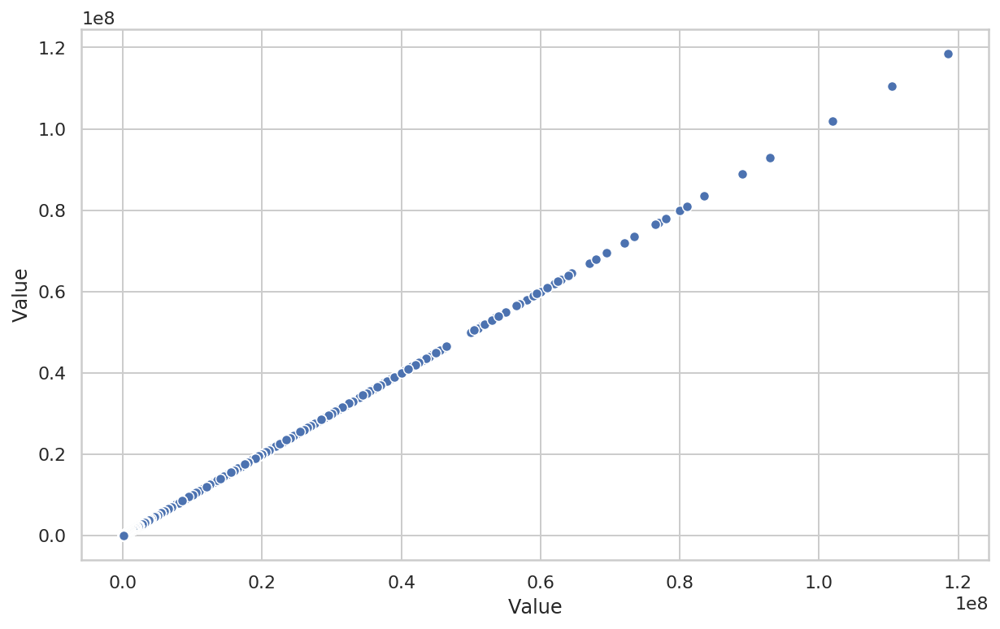

In [35]:
sns.scatterplot(data["Value"], data["Value"])

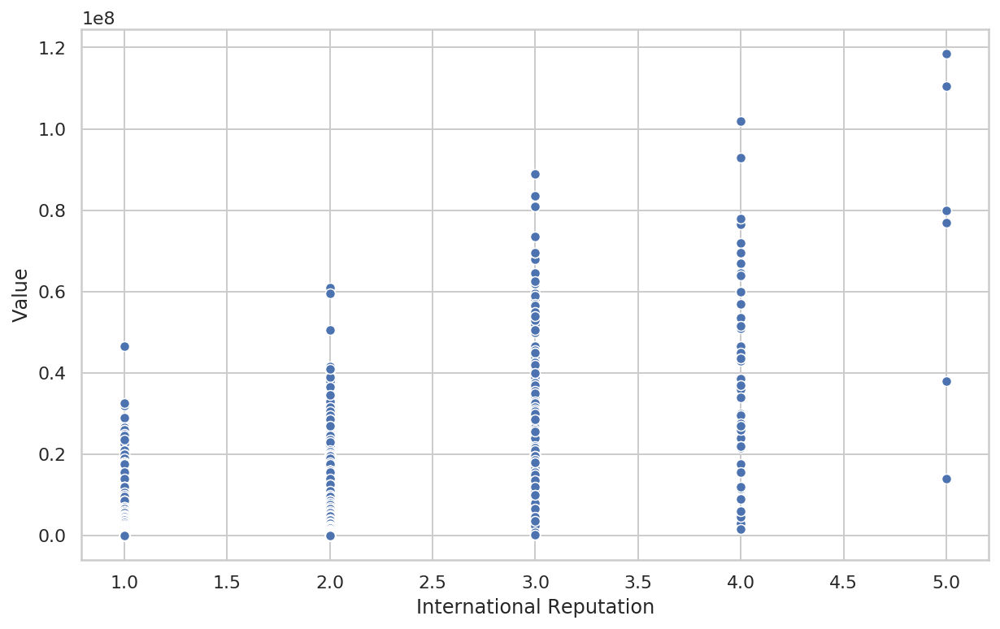

In [36]:
sns.scatterplot(data["International Reputation"], data["Value"])

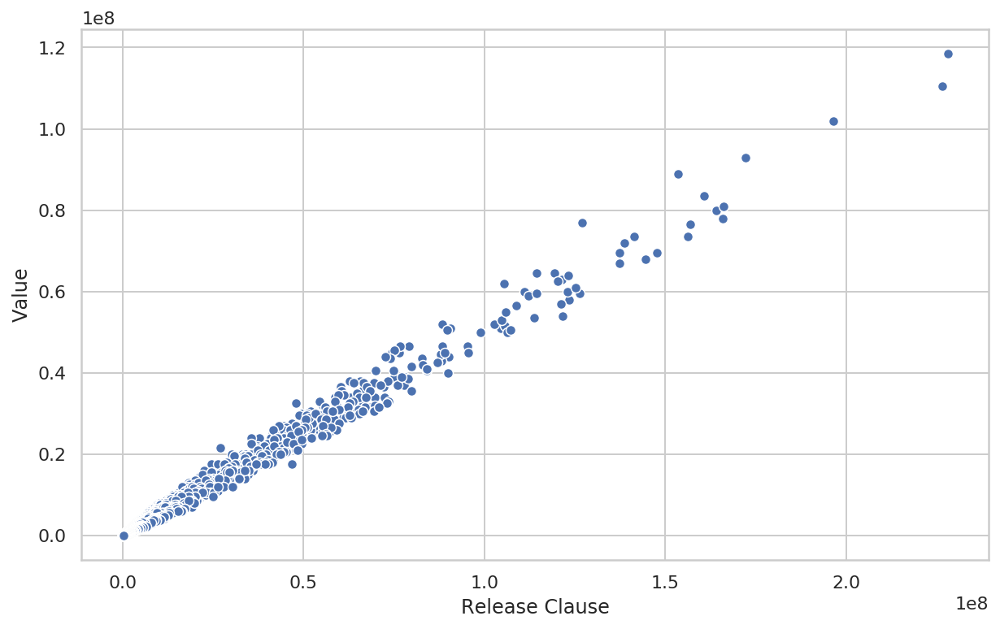

In [37]:
sns.scatterplot(data["Release Clause"], data["Value"])

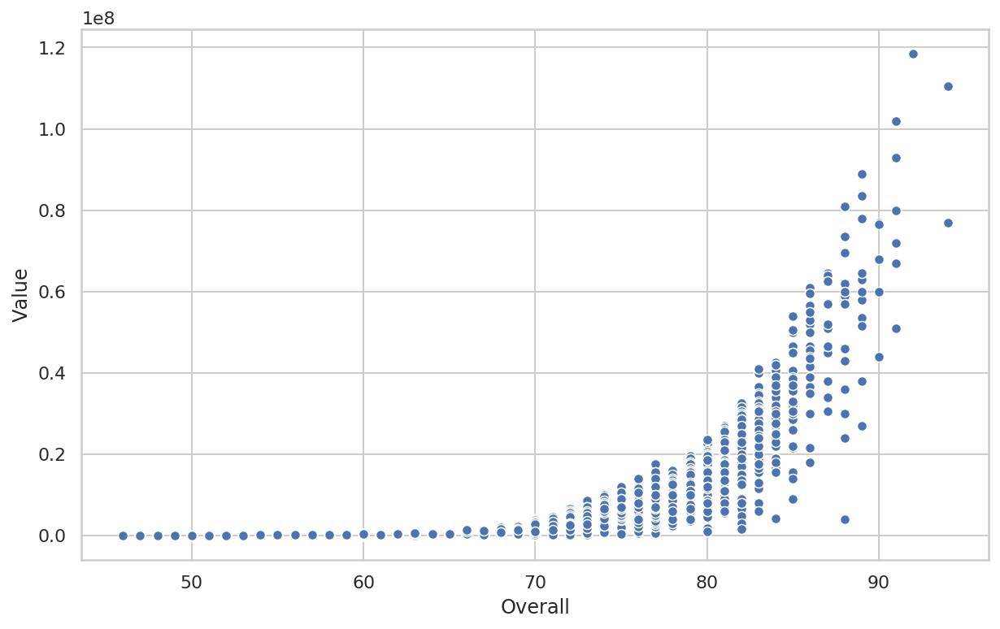

In [6]:
sns.scatterplot(data["Overall"], data["Value"])

## Pair analysis between numerical attributes with hue on 'Position' attribute

In [38]:
def show_boxplot_for_attribute_and_category(attribute, category, ):
    plt.figure(figsize=(15, 10))
    sns.boxplot(x=category, y=attribute, data=data)

Let's perform an analysis of all numeric attributes regarding to the player's position

In [39]:
# for col in numeric_columns:
#     show_boxplot_for_attribute_and_category(attribute=col, category="Position")
#     plt.show()

In [40]:
# for col in numeric_columns:
#     show_boxplot_for_attribute_and_category(attribute=col, category="Position (4)")
#     plt.show()

In [41]:
# for col in numeric_columns:
#     show_boxplot_for_attribute_and_category(attribute=col, category="Position (13)")
#     plt.show()

## Pair analysis between 'Position' and other categorical attributes

In [42]:
def show_crosstab_stacked_histogram(index, column):
    pd.crosstab(index=data[index], columns=data[column]).plot.bar(stacked=True)

In [43]:
# for col in meaningful_categorical_attributes:
#     show_crosstab_stacked_histogram(index="Position", column=col)
#     plt.show()

In [44]:
# for col in meaningful_categorical_attributes:
#     show_crosstab_stacked_histogram(index="Position (4)", column=col)
#     plt.show()

In [45]:
# for col in meaningful_categorical_attributes:
#     show_crosstab_stacked_histogram(index="Position (13)", column=col)
#     plt.show()

## Pair analysis between 'Value' and other categorical attributes

In [46]:
def show_catplot_for_numeric_attr_by_category(numeric_attr, category_attr):
    sns.catplot(x=category_attr, y=numeric_attr, data=data, kind='bar', height=20)

In [47]:
# for col in meaningful_categorical_attributes:
#     show_catplot_for_numeric_attr_by_category(numeric_attr="Value", category_attr=col)
#     plt.show()

Distribution of `Wage` attribute for every player position (`Positon (4)`).

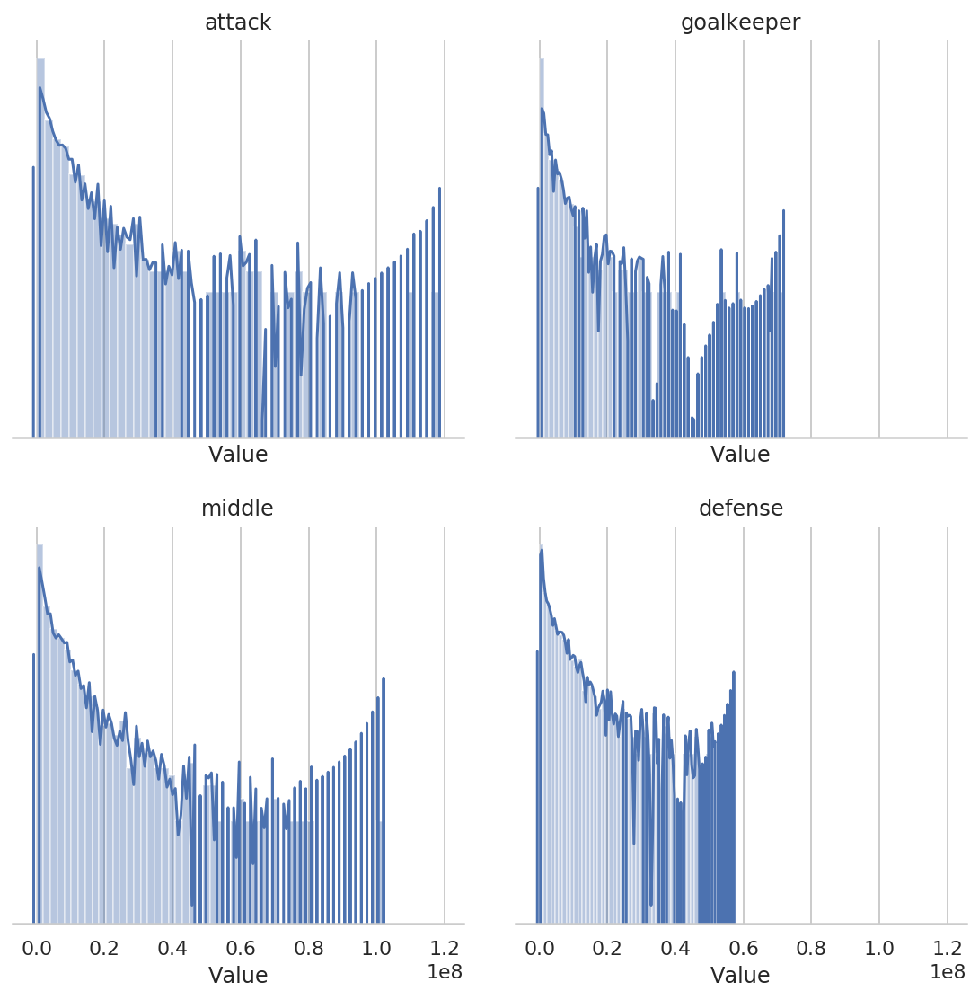

In [48]:
f, axes = plt.subplots(2, 2, figsize=(8, 8), sharex=True)
sns.despine(left=True)

positions = ['attack', 'goalkeeper', 'middle', 'defense']

for p, a in zip(positions, [[0, 0], [0, 1], [1, 0], [1, 1]]):
    x = data[data['Position (4)'] == p]['Value']
    ax = sns.distplot(x, ax=axes[a[0], a[1]])
    ax.set_yscale('log')
    ax.set_title(p)

plt.setp(axes, yticks=[])
plt.tight_layout()

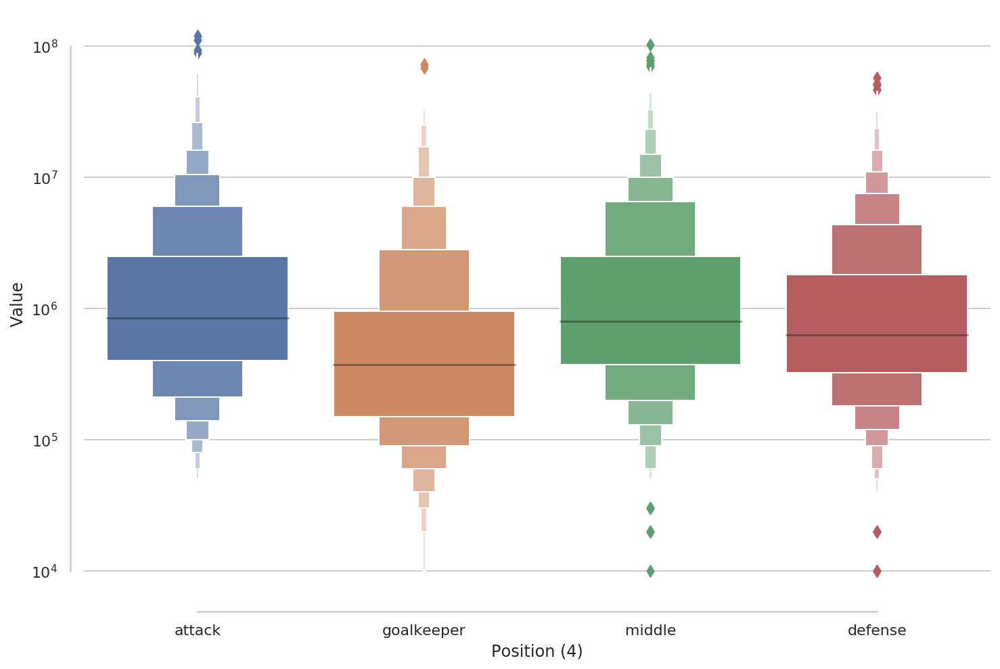

In [49]:
fig, ax = plt.subplots(figsize=(12, 8))
ax = sns.boxenplot(y="Value", x="Position (4)", data=data, ax=ax)
ax.set_yscale('log')
sns.despine(offset=10, trim=True)

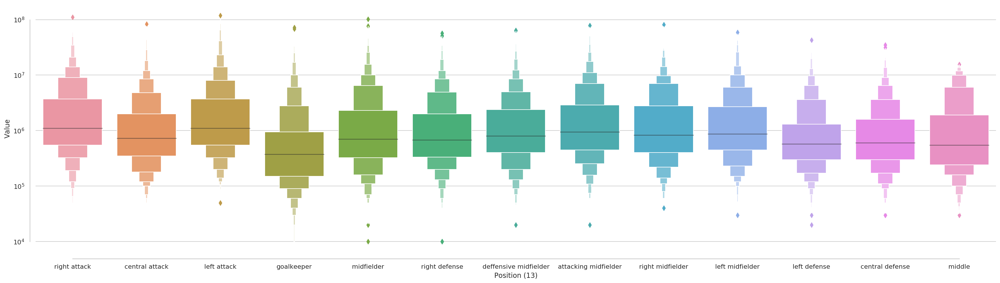

In [50]:
fig, ax = plt.subplots(figsize=(30, 8))
ax = sns.boxenplot(y="Value", x="Position (13)", data=data, ax=ax)
ax.set_yscale('log')
sns.despine(offset=10, trim=True)

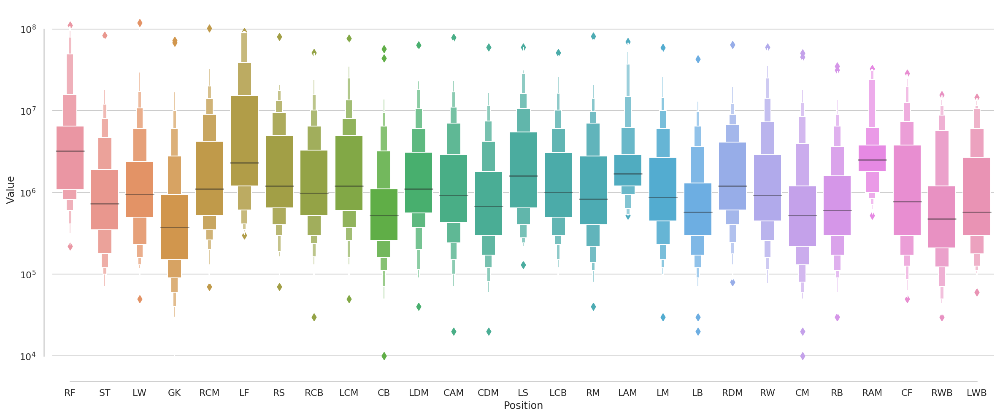

In [51]:
fig, ax = plt.subplots(figsize=(20, 8))
ax = sns.boxenplot(y="Value", x="Position", data=data, ax=ax)
ax.set_yscale('log')
sns.despine(offset=10, trim=True)